<a href="https://colab.research.google.com/github/alfinyusriansyah/ml-ops/blob/main/(64_Batch_Size_256_Embedding)Image_Captioning_VGG16_AlternativeRNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Captioning Generator VGG16 Alternative RNN

for colab runtime disconnect

```function ConnectButton(){
    console.log("Connect pushed"); 
    document.querySelector("#top-toolbar > colab-connectbutton").shadowRoot.querySelector("#connect").click() 
}
setInterval(ConnectButton,60000);```

### Library ✅

In [ ]:
import numpy as np
from collections import Counter 
import pandas as pd
import tensorflow as tf
from nltk.translate.bleu_score import corpus_bleu
from keras.callbacks import ReduceLROnPlateau

from tqdm import tqdm
import os
from pickle import load, dump
import string
from datetime import datetime as dt
import random
from PIL import Image
import matplotlib.pyplot as plt

from keras.callbacks import ModelCheckpoint
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.models import load_model
from keras.layers import Input, Dense, Dropout, LSTM, Embedding, concatenate, RepeatVector, TimeDistributed, Bidirectional
from keras.preprocessing import image
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.utils import load_img

### Drive and Check Path ✅

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pwd

In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/Image-Caption-Generator

### Download Data & Unzip ✅

In [ ]:
# !wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip

In [ ]:
# !wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip

In [ ]:
# !unzip Flickr8k_Dataset.zip

In [ ]:
# !unzip Flickr8k_text.zip

## Config ✅

In [ ]:
config = {
	'images_path': 'train_val_data/Flicker8k_Datasetcoba/', #Make sure you put that last slash(/)
	'train_data_path': 'train_val_data/Flickr_8k.trainImages.txt',
	'val_data_path': 'train_val_data/Flickr_8k.devImages.txt',
	'captions_path': 'train_val_data/Flickr8k.token.txt',
	'tokenizer_path': 'model_data/tokenizer.pkl',
	'model_data_path': 'model_data/', #Make sure you put that last slash(/)
	'num_of_epochs': 50,
	'max_length': 40, #This is set manually after training of model and required for test.py
	'batch_size': 64,
	'beam_search_k':3,
	'test_data_path': 'test_data/', #Make sure you put that last slash(/)
	'output_test_data_path': 'test_data/AlternativeVgg16/',
	'model_type': 'vgg16',
	'random_seed': 1035
}

rnnConfig = {
	'embedding_size': 256,
	'LSTM_units': 256,
	'dense_units': 256,
	'dropout': 0.5
}

## Model CNN ✅

Define CNN Model

In [ ]:
def CNNModel(model_type):
	model = VGG16()
	model.layers.pop()
	model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
	return model

## PreProcessing

This function returns a dictionary of form:

	{
		image_id1 : image_features1,
		image_id2 : image_features2,
		...
	}

In [ ]:
def extract_features(path, model_type):
	model_type = 'vgg16'
	from keras.applications.vgg16 import preprocess_input
	target_size = (224, 224)
	# Get CNN Model from model.py
	model = CNNModel(model_type)
	features = dict()
	# Extract features from each photo
	for name in tqdm(os.listdir(path)):
		# Loading and resizing image
		filename = path + name
		image = load_img(filename, target_size=target_size)
		# Convert the image pixels to a numpy array
		image = img_to_array(image)
		# Reshape data for the model
		image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
		# Prepare the image for the CNN Model model
		image = preprocess_input(image)
		# Pass image into model to get encoded features
		feature = model.predict(image, verbose=0)
		# Store encoded features for the image
		image_id = name.split('.')[0]
		features[image_id] = feature
	return features

In [ ]:
import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)

In [ ]:
features = extract_features(config['images_path'], config['model_type'])
print(features)

In [ ]:
len(data)

4096

In [ ]:
features = extract_features(config['images_path'], config['model_type'])
print(features)

100%|██████████| 28/28 [00:02<00:00,  9.57it/s]

{'Salinan 10815824_2997e03d76': array([[0., 0., 0., ..., 0., 0., 0.]], dtype=float32), 'Salinan 27782020_4dab210360': array([[0.0521872, 0.       , 0.       , ..., 0.       , 1.1151302,
        1.2605721]], dtype=float32), 'Salinan 3637013_c675de7705': array([[0.        , 2.179986  , 0.        , ..., 3.2890034 , 0.40235928,
        0.        ]], dtype=float32), 'Salinan 17273391_55cfc7d3d4': array([[0.       , 1.0276399, 2.4770684, ..., 3.1528466, 0.       ,
        0.       ]], dtype=float32), 'Salinan 667626_18933d713e': array([[0.      , 0.      , 0.      , ..., 0.      , 2.886005, 0.      ]],
      dtype=float32), 'Salinan 12830823_87d2654e31': array([[2.1086688, 0.       , 2.1618612, ..., 0.9306984, 0.       ,
        0.       ]], dtype=float32), 'Salinan 19212715_20476497a3': array([[0.47080746, 0.        , 0.        , ..., 0.        , 0.22003408,
        1.2002759 ]], dtype=float32), 'Salinan 23445819_3a458716c1': array([[0.      , 0.      , 5.448217, ..., 0.      , 0.      , 0.

Extract captions for images
Glimpse of file:
	
  1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
	
  1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
	
  1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
	
  1000268201_693b08cb0e.jpg#3	A little girl climbing the stairs to her playhouse .
	
  1000268201_693b08cb0e.jpg#4	A little girl in a pink dress going into a wooden cabin .

In [ ]:
def load_captions(filename):
  file = open(filename, 'r')
  doc = file.read()
  file.close()
  captions = dict()
  # Process lines by line
  count = 0
  for line in doc.split('\n'):
    # Split line on white space
    tokens = line.split()
    if len(line) < 2:
      continue
    # Take the first token as the image id, the rest as the caption
    image_id, image_caption = tokens[0], tokens[1:]
    # Extract filename from image id
    image_id = image_id.split('.')[0]
    # Convert caption tokens back to caption string
    image_caption = ' '.join(image_caption)
    # Create the list if needed
    if image_id not in captions:
      captions[image_id] = list()
    # Store caption
    captions[image_id].append(image_caption)
    _count = _count+1
  print('{}: Parsed captions: {}'.format(mytime(),_count))
  return captions

Captions dict is of form:

	{
		image_id1 : [caption1, caption2, etc],
		image_id2 : [caption1, caption2, etc],
		...
	}

In [ ]:
def clean_captions(captions):
	# Prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for _, caption_list in captions.items():
		for i in range(len(caption_list)):
			caption = caption_list[i]
			# Tokenize i.e. split on white spaces
			caption = caption.split()
			# Convert to lowercase
			caption = [word.lower() for word in caption]
			# Remove punctuation from each token
			caption = [w.translate(table) for w in caption]
			# Remove hanging 's' and 'a'
			caption = [word for word in caption if len(word)>1]
			# Remove tokens with numbers in them
			caption = [word for word in caption if word.isalpha()]
			# Store as string
			caption_list[i] =  ' '.join(caption)

Save captions to file, one per line
After saving, captions.txt is of form :- 'id' 'caption'
	
  Example : 2252123185_487f21e336 --- stadium full of people watch game

In [ ]:
def save_captions(captions, filename):
	lines = list()
	for key, captions_list in captions.items():
		for caption in captions_list:
			lines.append(key + ' ' + caption)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()

In [ ]:
def preprocessData(config):
	print('{}: Using {} model'.format(mytime(),config['model_type'].title()))
	# Extract features from all images
	if os.path.exists(config['model_data_path']+'features_'+str(config['model_type'])+'.pkl'):
		print('{}: Image features already generated at {}'.format(mytime(), config['model_data_path']+'features_'+str(config['model_type'])+'.pkl'))
	else:
		print('{}: Generating image features using '+str(config['model_type'])+' model...'.format(mytime()))
		features = extract_features(config['images_path'], config['model_type'])
		# Save to file
		dump(features, open(config['model_data_path']+'features_'+str(config['model_type'])+'.pkl', 'wb'))
		print('{}: Completed & Saved features for {} images successfully'.format(mytime(),len(features)))
	# Load file containing captions and parse them
	if os.path.exists(config['model_data_path']+'captions.txt'):
		print('{}: Parsed caption file already generated at {}'.format(mytime(), config['model_data_path']+'captions.txt'))
	else:
		print('{}: Parsing captions file...'.format(mytime()))
		captions = load_captions(config['captions_path'])
		# Clean captions
		# Ignore this function because Tokenizer from keras will handle cleaning
		# clean_captions(captions)
		# Save captions
		save_captions(captions, config['model_data_path']+'captions.txt')
		print('{}: Parsed & Saved successfully'.format(mytime()))

## Visualisasi Data

In [ ]:
dir_Flickr_text = "/content/drive/MyDrive/Colab Notebooks/Image-Caption-Generator/train_val_data/Flickr8k.token.txt"
file = open(dir_Flickr_text,'r')
text = file.read()
file.close()


datatxt = []
for line in text.split('\n'):
    col = line.split('\t')
    if len(col) == 1:
        continue
    w = col[0].split("#")
    datatxt.append(w + [col[1].lower()])

df_txt = pd.DataFrame(datatxt,columns=["filename","index","caption"])

uni_filenames = np.unique(df_txt.filename.values)
print("The number of unique file names : {}".format(len(uni_filenames)))
print("The distribution of the number of captions for each image:")
Counter(Counter(df_txt.filename.values).values())

The number of unique file names : 8092
The distribution of the number of captions for each image:


Counter({5: 8092})

In [ ]:
def df_word(df_txt):
    vocabulary = []
    for i in range(len(df_txt)):
        temp=df_txt.iloc[i,2]
        vocabulary.extend(temp.split())
    print('Vocabulary Size: %d' % len(set(vocabulary)))
    ct = Counter(vocabulary)
    dfword = pd.DataFrame({"word":list(ct.keys()),"count":list(ct.values())})
    dfword = dfword.sort_values("count",ascending=False)
    dfword = dfword.reset_index()[["word","count"]]
    return(dfword)
dfword = df_word(df_txt)
dfword.head(10)

Vocabulary Size: 8918


,word,count
0,a,62989
1,.,36581
2,in,18975
3,the,18419
4,on,10744
5,is,9345
6,and,8852
7,dog,8136
8,with,7765
9,man,7266


In [ ]:
# 50 most occuring word 
topn=50 

def plthist(dfsub,title='50 most occuring words'):
    plt.figure(figsize=(20,3))
    plt.bar(dfsub.index,dfsub['count'])
    plt.yticks(fontsize=20)
    plt.xticks(dfsub.index,dfsub['word'],rotation=90,fontsize=20)
    plt.title(title,fontsize=20)
    plt.show()

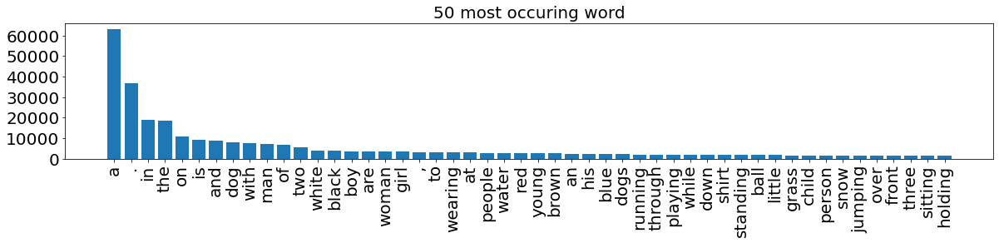

In [ ]:
plthist(dfword.iloc[:topn,:],title="50 most occuring word")

## Load Data ✅

We have Flickr_8k.trainImages.txt and Flickr_8k.devImages.txt files which consist of unique identifiers(id) . which can be used to filter the images and their descriptions

Load a pre-defined list of image identifiers(id)
Glimpse of file:
	
  2513260012_03d33305cf.jpg
	
  2903617548_d3e38d7f88.jpg
	
  3338291921_fe7ae0c8f8.jpg
	
  488416045_1c6d903fe0.jpg
	
  2644326817_8f45080b87.jpg

In [ ]:
def load_set(filename):
	file = open(filename, 'r')
	doc = file.read()
	file.close()
	ids = list()
	# Process line by line
	for line in doc.split('\n'):
		# Skip empty lines
		if len(line) < 1:
			continue
		# Get the image identifier(id)
		_id = line.split('.')[0]
		ids.append(_id)
	return set(ids)

The model we'll develop will generate a caption for a given image and the caption will be generated one word at a time. 

The sequence of previously generated words will be provided as input. Therefore, we will need a ‘first word’ to kick-off the generation process and a 'last word' to signal the end of the caption.

We'll use the strings ‘startseq‘ and ‘endseq‘ for this purpose. These tokens are added to the captions as they are loaded. 

It is important to do this now before we encode the text so that the tokens are also encoded correctly.

Load captions into memory

Glimpse of file:

1000268201_693b08cb0e child in pink dress is climbing up set of stairs in an entry way

1000268201_693b08cb0e girl going into wooden building

1000268201_693b08cb0e little girl climbing into wooden playhouse

1000268201_693b08cb0e little girl climbing the stairs to her playhouse

1000268201_693b08cb0e little girl in pink dress going into wooden cabin

In [ ]:
def load_cleaned_captions(filename, ids):
	file = open(filename, 'r')
	doc = file.read()
	file.close()
	captions = dict()
	_count = 0
	# Process line by line
	for line in doc.split('\n'):
		# Split line on white space
		tokens = line.split()
		# Split id from caption
		image_id, image_caption = tokens[0], tokens[1:]
		# Skip images not in the ids set
		if image_id in ids:
			# Create list
			if image_id not in captions:
				captions[image_id] = list()
			# Wrap caption in start & end tokens
			caption = 'startseq ' + ' '.join(image_caption) + ' endseq'
			# Store
			captions[image_id].append(caption)
			_count = _count+1
	return captions, _count

In [ ]:
# Load image features
def load_image_features(filename, ids):
	# load all features
	all_features = load(open(filename, 'rb'))
	# filter features
	features = {_id: all_features[_id] for _id in ids}
	return features

In [ ]:
# Convert a dictionary to a list
def to_lines(captions):
	all_captions = list()
	for image_id in captions.keys():
		[all_captions.append(caption) for caption in captions[image_id]]
	return all_captions

The captions will need to be encoded to numbers before it can be presented to the model.

The first step in encoding the captions is to create a consistent mapping from words to unique integer values.

Keras provides the Tokenizer class that can learn this mapping from the loaded captions.

Fit a tokenizer on given captions

In [ ]:
def create_tokenizer(captions):
	lines = to_lines(captions)
	tokenizer = Tokenizer()
	tokenizer.fit_on_texts(lines)
	return tokenizer

In [ ]:
# Calculate the length of the captions with the most words
def calc_max_length(captions):
	lines = to_lines(captions)
	return max(len(line.split()) for line in lines)

In [ ]:
# Create sequences of images, input sequences and output words for an image
def create_sequences(tokenizer, max_length, captions_list, image):
	# X1 : input for image features
	# X2 : input for text features
	# y  : output word
	X1, X2, y = list(), list(), list()
	vocab_size = len(tokenizer.word_index) + 1
	# Walk through each caption for the image
	for caption in captions_list:
		# Encode the sequence
		seq = tokenizer.texts_to_sequences([caption])[0]
		# Split one sequence into multiple X,y pairs
		for i in range(1, len(seq)):
			# Split into input and output pair
			in_seq, out_seq = seq[:i], seq[i]
			# Pad input sequence
			in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
			# Encode output sequence
			out_seq = tf.keras.utils.to_categorical([out_seq], num_classes=vocab_size)[0]
			# Store
			X1.append(image)
			X2.append(in_seq)
			y.append(out_seq)
	return X1, X2, y

In [ ]:
# Data generator, intended to be used in a call to model.fit_generator()
def data_generator(images, captions, tokenizer, max_length, batch_size, random_seed):
	# Setting random seed for reproducibility of results
	random.seed(random_seed)
	# Image ids
	image_ids = list(captions.keys())
	_count=0
	assert batch_size<= len(image_ids), 'Batch size must be less than or equal to {}'.format(len(image_ids))
	while True:
		if _count >= len(image_ids):
			# Generator exceeded or reached the end so restart it
			_count = 0
		# Batch list to store data
		input_img_batch, input_sequence_batch, output_word_batch = list(), list(), list()
		for i in range(_count, min(len(image_ids), _count+batch_size)):
			# Retrieve the image id
			image_id = image_ids[i]
			# Retrieve the image features
			image = images[image_id][0]
			# Retrieve the captions list
			captions_list = captions[image_id]
			# Shuffle captions list
			random.shuffle(captions_list)
			input_img, input_sequence, output_word = create_sequences(tokenizer, max_length, captions_list, image)
			# Add to batch
			for j in range(len(input_img)):
				input_img_batch.append(input_img[j])
				input_sequence_batch.append(input_sequence[j])
				output_word_batch.append(output_word[j])
		_count = _count + batch_size
		yield [[np.array(input_img_batch), np.array(input_sequence_batch)], np.array(output_word_batch)]

In [ ]:
def loadTrainData(config):
	train_image_ids = load_set(config['train_data_path'])
	# Check if we already have preprocessed data saved and if not, preprocess the data.
	# Create and save 'captions.txt' & features.pkl
	preprocessData(config)
	# Load captions
	train_captions, _count = load_cleaned_captions(config['model_data_path']+'captions.txt', train_image_ids)
	# Load image features
	train_image_features = load_image_features(config['model_data_path']+'features_'+str(config['model_type'])+'.pkl', train_image_ids)
	print('{}: Available images for training: {}'.format(mytime(),len(train_image_features)))
	print('{}: Available captions for training: {}'.format(mytime(),_count))
	if not os.path.exists(config['model_data_path']+'tokenizer.pkl'):
		# Prepare tokenizer
		tokenizer = create_tokenizer(train_captions)
		# Save the tokenizer
		dump(tokenizer, open(config['model_data_path']+'tokenizer.pkl', 'wb'))
	# Determine the maximum sequence length
	max_length = calc_max_length(train_captions)
	return train_image_features, train_captions, max_length

In [ ]:
def loadValData(config):
	val_image_ids = load_set(config['val_data_path'])
	# Load captions
	val_captions, _count = load_cleaned_captions(config['model_data_path']+'captions.txt', val_image_ids)
	# Load image features
	val_features = load_image_features(config['model_data_path']+'features_'+str(config['model_type'])+'.pkl', val_image_ids)
	print('{}: Available images for validation: {}'.format(mytime(),len(val_features)))
	print('{}: Available captions for validation: {}'.format(mytime(),_count))
	return val_features, val_captions

## Map an integer to a word

In [ ]:
def int_to_word(integer, tokenizer):
	for word, index in tokenizer.word_index.items():
		if index == integer:
			return word
	return None

## Model RNN ✅

Define Alternative RNN Model

In [ ]:
def AlternativeRNNModel(vocab_size, max_len, rnnConfig, model_type):
	embedding_size = rnnConfig['embedding_size']
	# VGG16 outputs a 4096 dimensional vector for each image, which we'll feed to RNN Model
	image_input = Input(shape=(4096,))
	image_model_1 = Dense(embedding_size, activation='relu')(image_input)
	image_model = RepeatVector(max_len)(image_model_1)

	caption_input = Input(shape=(max_len,))
	# mask_zero: We zero pad inputs to the same length, the zero mask ignores those inputs. E.g. it is an efficiency.
	caption_model_1 = Embedding(vocab_size, embedding_size, mask_zero=True)(caption_input)
	# Since we are going to predict the next word using the previous words
	# (length of previous words changes with every iteration over the caption), we have to set return_sequences = True.
	caption_model_2 = LSTM(rnnConfig['LSTM_units'], return_sequences=True)(caption_model_1)
	# caption_model = TimeDistributed(Dense(embedding_size, activation='relu'))(caption_model_2)
	caption_model = TimeDistributed(Dense(embedding_size))(caption_model_2)

	# Merging the models and creating a softmax classifier
	final_model_1 = concatenate([image_model, caption_model])
	# final_model_2 = LSTM(rnnConfig['LSTM_units'], return_sequences=False)(final_model_1)
	final_model_2 = Bidirectional(LSTM(rnnConfig['LSTM_units'], return_sequences=False))(final_model_1)
	# final_model_3 = Dense(rnnConfig['dense_units'], activation='relu')(final_model_2)
	# final_model = Dense(vocab_size, activation='softmax')(final_model_3)
	final_model = Dense(vocab_size, activation='softmax')(final_model_2)

	model = Model(inputs=[image_input, caption_input], outputs=final_model)
	model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=["accuracy"])
	# model.compile(loss='categorical_crossentropy', optimizer='rmsprop')
	return model

## Train

In [ ]:
# Setting random seed for reproducibility of results
random.seed(config['random_seed'])

In [ ]:
assert type(config['num_of_epochs']) is int, 'Please provide an integer value for `num_of_epochs` parameter in config.py file'
assert type(config['max_length']) is int, 'Please provide an integer value for `max_length` parameter in config.py file'
assert type(config['batch_size']) is int, 'Please provide an integer value for `batch_size` parameter in config.py file'
assert type(config['beam_search_k']) is int, 'Please provide an integer value for `beam_search_k` parameter in config.py file'
assert type(config['random_seed']) is int, 'Please provide an integer value for `random_seed` parameter in config.py file'
assert type(rnnConfig['embedding_size']) is int, 'Please provide an integer value for `embedding_size` parameter in config.py file'
assert type(rnnConfig['LSTM_units']) is int, 'Please provide an integer value for `LSTM_units` parameter in config.py file'
assert type(rnnConfig['dense_units']) is int, 'Please provide an integer value for `dense_units` parameter in config.py file'
assert type(rnnConfig['dropout']) is float, 'Please provide a float value for `dropout` parameter in config.py file'

In [ ]:
X1train, X2train, max_length = loadTrainData(config)

10:0:51: Using Vgg16 model
10:0:51: Image features already generated at model_data/features_vgg16.pkl
10:0:51: Parsed caption file already generated at model_data/captions.txt
10:0:52: Available images for training: 6000
10:0:52: Available captions for training: 30000


In [ ]:
X1val, X2val = loadValData(config)

10:0:54: Available images for validation: 1000
10:0:54: Available captions for validation: 5000


Load the tokenizer

In [ ]:
tokenizer = load(open(config['tokenizer_path'], 'rb'))
vocab_size = len(tokenizer.word_index) + 1

Now that we have the image features from CNN model, we need to feed them to a RNN Model.

Define the RNN model

In [ ]:
model = AlternativeRNNModel(vocab_size, max_length, rnnConfig, config['model_type'])
print('Another RNN Model (Decoder) Summary : ')
print(model.summary())

Another RNN Model (Decoder) Summary : 
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 40)]         0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 4096)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 40, 256)      1888768     ['input_2[0][0]']                
                                                                                                  
 dense (Dense)                  (None, 256)          1048832     ['input_1[0][0]']                
                                                       

Train the model save after each epoch

In [ ]:
num_of_epochs = config['num_of_epochs']
batch_size = config['batch_size']

steps_train = len(X2train)//batch_size
if len(X2train)%batch_size!=0:
    steps_train = steps_train+1
    
steps_val = len(X2val)//batch_size
if len(X2val)%batch_size!=0:
    steps_val = steps_val+1

model_save_path = config['model_data_path']+"Best_Model_Alternative"+str(config['model_type'])+"last.hdf5"
checkpoint = ModelCheckpoint(model_save_path
                             , monitor='val_loss'
                             , verbose=1
                             , save_best_only=True
                             , mode='min')

reduce_lr = ReduceLROnPlateau(monitor='val_loss'
                              , patience = 4
                              , verbose = 1
                              , factor = 0.01
                              , min_lr = 1e-50
                              , decay = 0.001/32 )

def scheduler(epoch, lr):
  if epoch < 20:
    return lr
  elif epoch > 70 and epoch < 100:
    return lr
  elif epoch > 120 and epoch < 150:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

callbacks = [tf.keras.callbacks.LearningRateScheduler(scheduler),checkpoint,reduce_lr]

print('steps_train: {}, steps_val: {}'.format(steps_train,steps_val))
print('Batch Size: {}'.format(batch_size))
print('Total Number of Epochs = {}'.format(num_of_epochs))

steps_train: 94, steps_val: 16
Batch Size: 64
Total Number of Epochs = 50


In [ ]:
# Shuffle train data
ids_train = list(X2train.keys())
random.shuffle(ids_train)
X2train_shuffled = {_id: X2train[_id] for _id in ids_train}
X2train = X2train_shuffled

In [ ]:
# Create the train data generator
# returns [[img_features, text_features], out_word]
generator_train = data_generator(X1train, X2train, tokenizer, max_length, batch_size, config['random_seed'])

In [ ]:
# Create the validation data generator
# returns [[img_features, text_features], out_word]
generator_val = data_generator(X1val, X2val, tokenizer, max_length, batch_size, config['random_seed'])

## Epochs

In [ ]:
# Fit for one epoch
history = model.fit(generator_train
                    , epochs=num_of_epochs
                    , steps_per_epoch=steps_train
                    , validation_data=generator_val
                    , validation_steps=steps_val
                    , callbacks=callbacks
                    , verbose=1)

Epoch 1/50
94/94 [==============================] - ETA: 0s - loss: 5.6363 - accuracy: 0.1521
Epoch 1: val_loss improved from inf to 5.22282, saving model to model_data/Best_Model_Alternativevgg16last.hdf5
94/94 [==============================] - 365s 4s/step - loss: 5.6363 - accuracy: 0.1521 - val_loss: 5.2228 - val_accuracy: 0.1713 - lr: 0.0010
Epoch 2/50
94/94 [==============================] - ETA: 0s - loss: 5.1719 - accuracy: 0.1734
Epoch 2: val_loss improved from 5.22282 to 4.98932, saving model to model_data/Best_Model_Alternativevgg16last.hdf5
94/94 [==============================] - 349s 4s/step - loss: 5.1719 - accuracy: 0.1734 - val_loss: 4.9893 - val_accuracy: 0.1736 - lr: 0.0010
Epoch 3/50
94/94 [==============================] - ETA: 0s - loss: 4.9528 - accuracy: 0.1823
Epoch 3: val_loss improved from 4.98932 to 4.78292, saving model to model_data/Best_Model_Alternativevgg16last.hdf5
94/94 [==============================] - 348s 4s/step - loss: 4.9528 - accuracy: 0.1823 

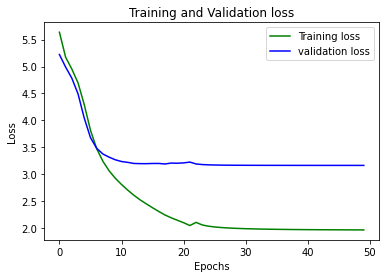

In [ ]:
loss_train = history.history['loss']
loss_val = history.history['val_loss']
epochs = range(0,50)
plt.plot(epochs, loss_train, 'g', label='Training loss')
plt.plot(epochs, loss_val, 'b', label='validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

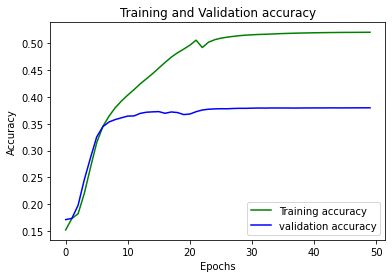

In [ ]:
loss_train = history.history['accuracy']
loss_val = history.history['val_accuracy']
epochs = range(0,50)
plt.plot(epochs, loss_train, 'g', label='Training accuracy')
plt.plot(epochs, loss_val, 'b', label='validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## Generate a caption for an image, given a pre-trained model and a tokenizer to map integer back to word

Uses BEAM Search algorithm

In [ ]:
def generate_caption_beam_search(model, tokenizer, image, max_length, beam_index=3):
	# in_text --> [[idx,prob]] ;prob=0 initially
	in_text = [[tokenizer.texts_to_sequences(['startseq'])[0], 0.0]]
	while len(in_text[0][0]) < max_length:
		tempList = []
		for seq in in_text:
			padded_seq = pad_sequences([seq[0]], maxlen=max_length)
			preds = model.predict([image,padded_seq], verbose=0)
			# Take top (i.e. which have highest probailities) `beam_index` predictions
			top_preds = np.argsort(preds[0])[-beam_index:]
			# Getting the top `beam_index` predictions and 
			for word in top_preds:
				next_seq, prob = seq[0][:], seq[1]
				next_seq.append(word)
				# Update probability
				prob += preds[0][word]
				# Append as input for generating the next word
				tempList.append([next_seq, prob])
		in_text = tempList
		# Sorting according to the probabilities
		in_text = sorted(in_text, reverse=False, key=lambda l: l[1])
		# Take the top words
		in_text = in_text[-beam_index:]
	in_text = in_text[-1][0]
	final_caption_raw = [int_to_word(i,tokenizer) for i in in_text]
	final_caption = []
	for word in final_caption_raw:
		if word=='endseq':
			break
		else:
			final_caption.append(word)
	final_caption.append('endseq')
	return ' '.join(final_caption)

Uses simple argmax

In [ ]:
def generate_caption(model, tokenizer, image, max_length):
	# Seed the generation process
	in_text = 'startseq'
	# Iterate over the whole length of the sequence
	for _ in range(max_length):
		# Integer encode input sequence
		sequence = tokenizer.texts_to_sequences([in_text])[0]
		# Pad input
		sequence = pad_sequences([sequence], maxlen=max_length)
		# Predict next word
		# The model will output a prediction, which will be a probability distribution over all words in the vocabulary.
		yhat = model.predict([image,sequence], verbose=0)
		# The output vector representins a probability distribution where maximum probability is the predicted word position
		# Take output class with maximum probability and convert to integer
		yhat = np.argmax(yhat)
		# Map integer back to word
		word = int_to_word(yhat, tokenizer)
		# Stop if we cannot map the word
		if word is None:
			break
		# Append as input for generating the next word
		in_text += ' ' + word
		# Stop if we predict the end of the sequence
		if word == 'endseq':
			break
	return in_text

## Test

In [ ]:
!pip install gtts
!pip install playsound

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for playsound: filename=playsound-1.3.0-py3-none-any.whl size=7035 sha256=9d9ee7c1ec0ed8b7c97c28329c98dd2e25e5792af59adb1fcff09663ef78f214
  Stored in directory: /root/.cache/pip/wheels/ba/f8/bb/ea57c0146b664dca3a0ada4199b0ecb5f9dfcb7b7e22b65ba2
Successfully built playsound


In [ ]:
assert type(config['max_length']) is int, 'Please provide an integer value for `max_length` parameter in config.py file'
assert type(config['beam_search_k']) is int, 'Please provide an integer value for `beam_search_k` parameter in config.py file'

In [ ]:
# Extract features from each image in the directory
def extract_features(filename, model, model_type):
	model_type == 'vgg16'
	from keras.applications.vgg16 import preprocess_input
	target_size = (224, 224)
	# Loading and resizing image
	image = load_img(filename, target_size=target_size)
	# Convert the image pixels to a numpy array
	image = img_to_array(image)
	# Reshape data for the model
	image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
	# Prepare the image for the CNN Model model
	image = preprocess_input(image)
	# Pass image into model to get encoded features
	features = model.predict(image, verbose=0)
	return features


In [ ]:
# Load the tokenizer
tokenizer_path = config['tokenizer_path']
tokenizer = load(open(tokenizer_path, 'rb'))

In [ ]:
# Max sequence length (from training)
max_length = config['max_length']

In [ ]:
# Load the model
caption_model = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/Image-Caption-Generator/model_data/Best_Model_Alternativevgg16last.hdf5')

image_model = CNNModel(config['model_type'])

553476096/553467096 [==============================] - 4s 0us/step


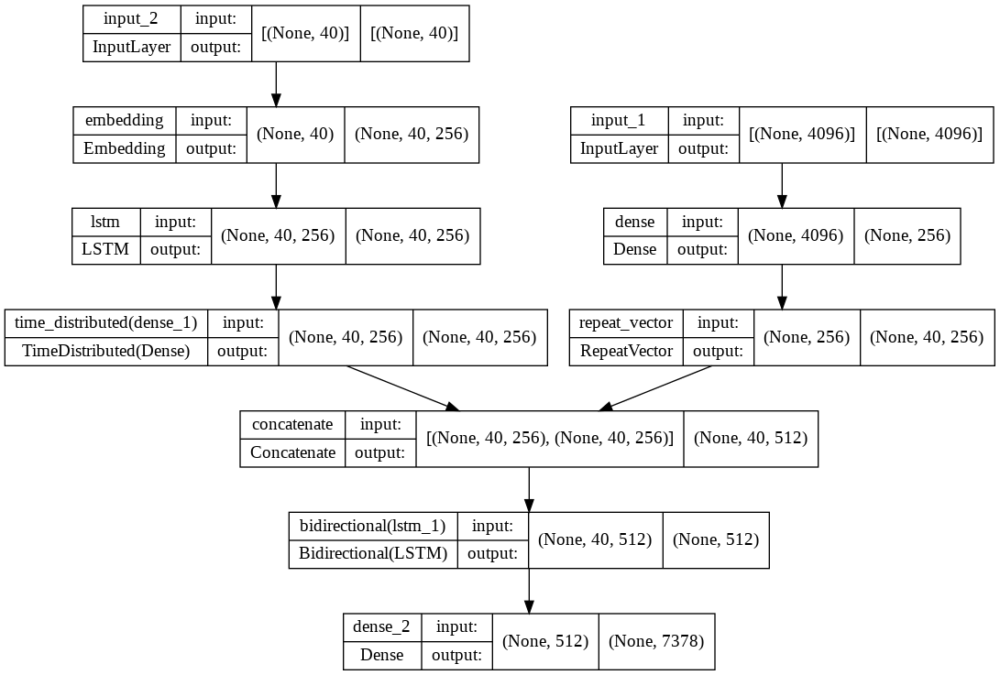

In [ ]:
# plot the model
tf.keras.utils.plot_model(caption_model, to_file='modelAlternativeRnn.png', show_shapes=True)

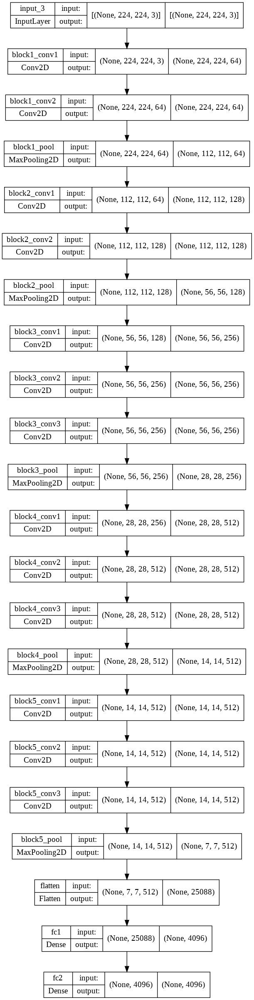

In [ ]:
# plot the model
tf.keras.utils.plot_model(image_model, to_file='modelCnn.png', show_shapes=True)

In [ ]:
from gtts import gTTS
from playsound import playsound
from IPython import display

playsound is relying on another python subprocess. Please use `pip install pygobject` if you want playsound to run more efficiently.


Generating caption for anjing(train).jpg


Generating caption for rider.jpg


Generating caption for bola.jpg


Generating caption for surfing.jpg


Generating caption for bike.jpg


Generating caption for banyak.jpg


Generating caption for blur.jpg


Generating caption for blur2.jpg


Generating caption for rock.jpg


Generating caption for snow.jpg


Generating caption for banyakmalam.jpg


Generating caption for dancingsiluet.jpg


Generating caption for baller.jpg


Generating caption for kuda.jpg


Generating caption for pacuankuda.jpg


Generating caption for game.png


Generating caption for boxing.jpg


Generating caption for bird.jpeg


Generating caption for memories.jpg


All Images :
 


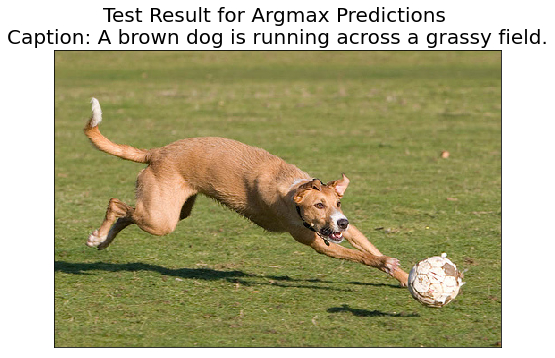

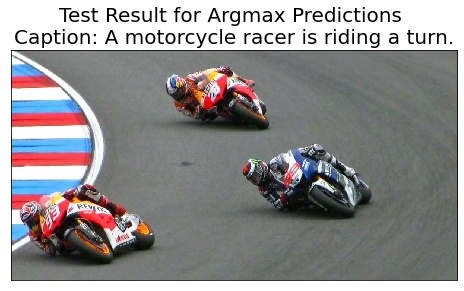

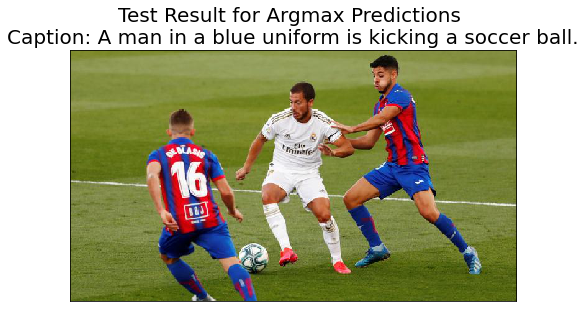

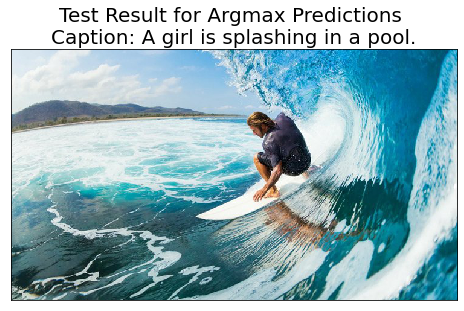

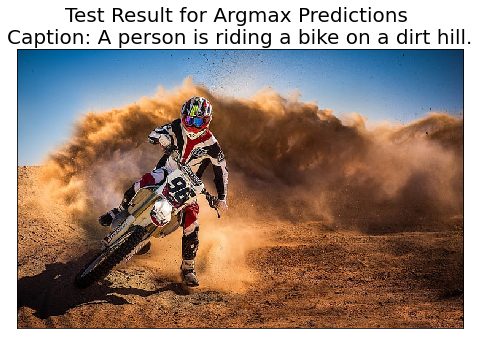

...

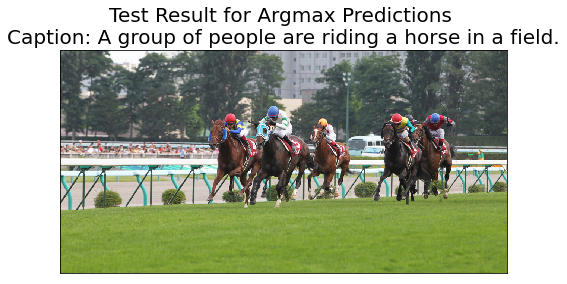

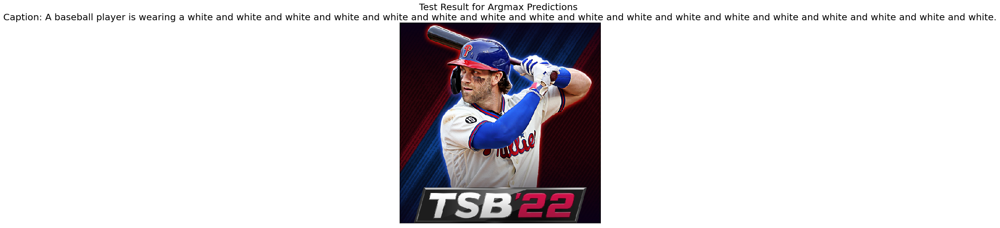

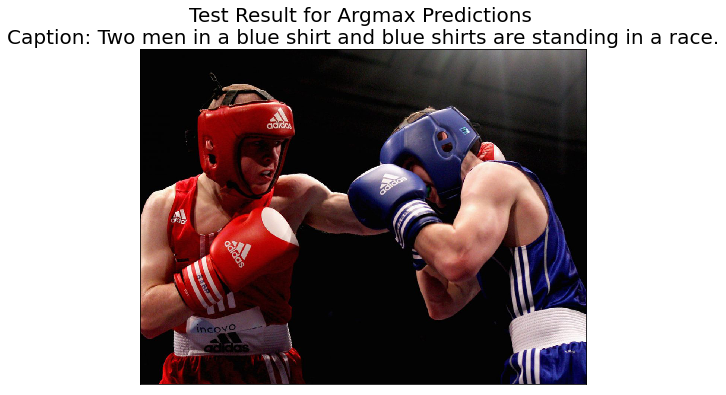

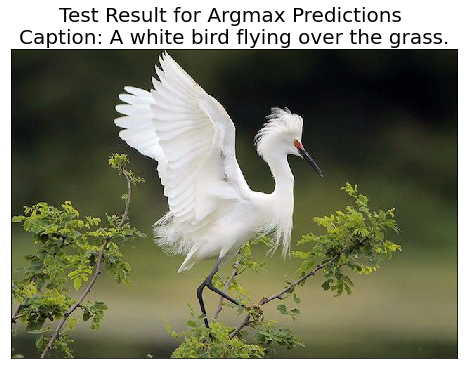

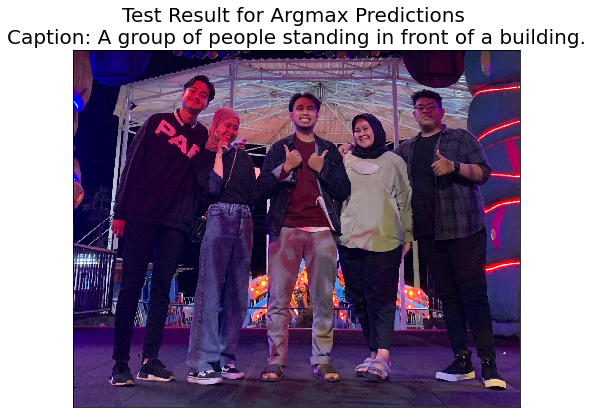

In [ ]:
# Load and prepare the image
try:
	for image_file in os.listdir(config['test_data_path']):
		if(image_file.split('--')[0]=='output'):
			continue
		if(image_file.split('.')[1]=='jpg' or image_file.split('.')[1]=='jpeg' or image_file.split('.')[1]=='png'):
			print('Generating caption for {}'.format(image_file))
			# Encode image using CNN Model
			image = extract_features(config['test_data_path']+image_file, image_model, config['model_type'])
			# Generate caption using Decoder RNN Model + argmax
			generated_caption = generate_caption(caption_model, tokenizer, image, max_length)
			# Remove startseq and endseq
			caption = 'Caption: ' + generated_caption.split()[1].capitalize()
			for x in generated_caption.split()[2:len(generated_caption.split())-1]:
				caption = caption + ' ' + x
			caption += '.'
			# Show image and its caption
			pil_im = Image.open(config['test_data_path']+image_file, 'r')
			fig, ax = plt.subplots(figsize=(8, 8))
			ax.get_xaxis().set_visible(False)
			ax.get_yaxis().set_visible(False)
			_ = ax.imshow(np.asarray(pil_im), interpolation='nearest')
			speech = gTTS('Predicted ' + caption, lang = 'en', slow = False)
			speech.save('voice.mp3')
			audio_file = 'voice.mp3'
			display.display(display.Audio(audio_file, rate = None, autoplay = False))
			_ = ax.set_title("Test Result for Argmax Predictions \n{}".format(caption), fontdict={'fontsize': '20','fontweight' : '40'})
			
			plt.savefig(config['output_test_data_path']+'output--'+image_file)
except IndexError:
	print("All Images :")
	print(" ")
	pass

Generating caption for anjing(train).jpg


Generating caption for rider.jpg


Generating caption for bola.jpg


Generating caption for surfing.jpg


Generating caption for bike.jpg


Generating caption for banyak.jpg


Generating caption for blur.jpg


Generating caption for blur2.jpg


Generating caption for rock.jpg


Generating caption for snow.jpg


Generating caption for banyakmalam.jpg


Generating caption for dancingsiluet.jpg


Generating caption for baller.jpg


Generating caption for kuda.jpg


Generating caption for pacuankuda.jpg


Generating caption for boxing.jpg


Generating caption for bird.jpeg


Generating caption for memories.jpg


All Images :
 


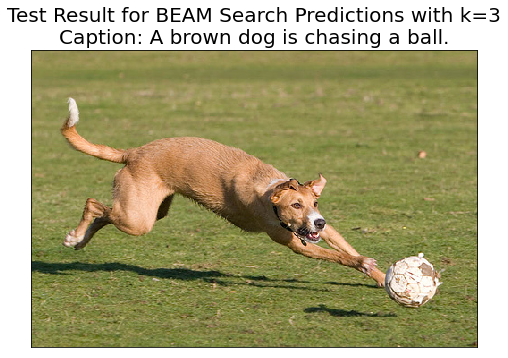

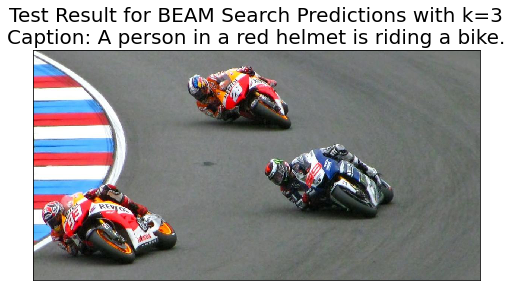

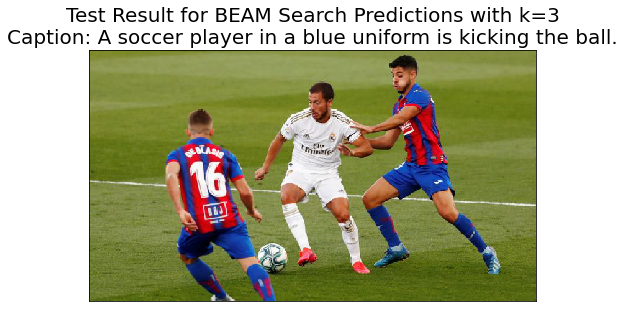

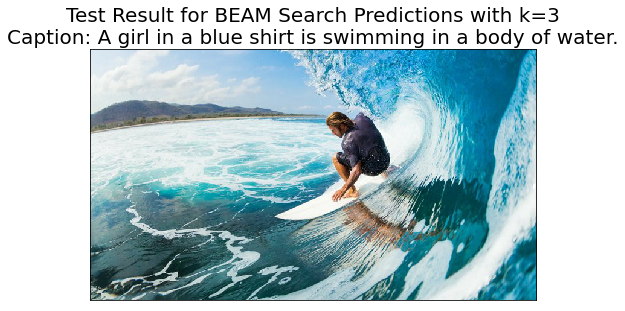

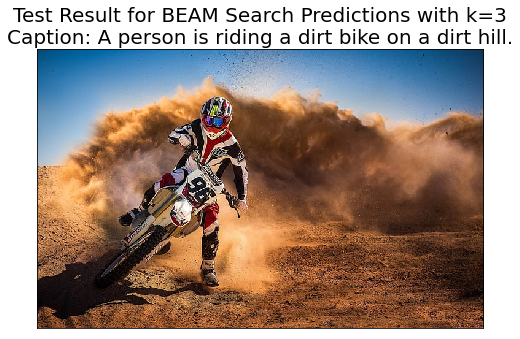

...

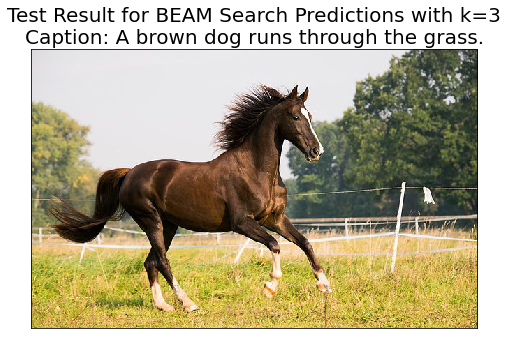

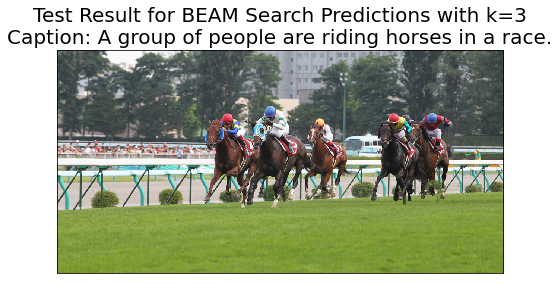

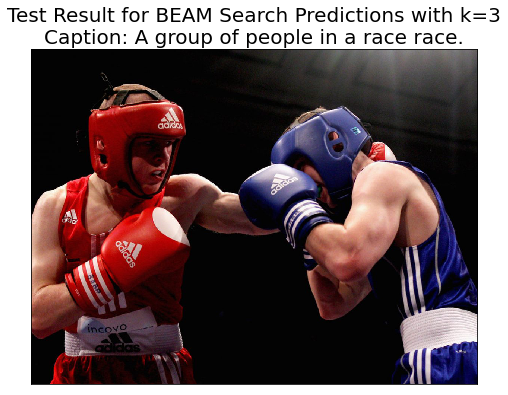

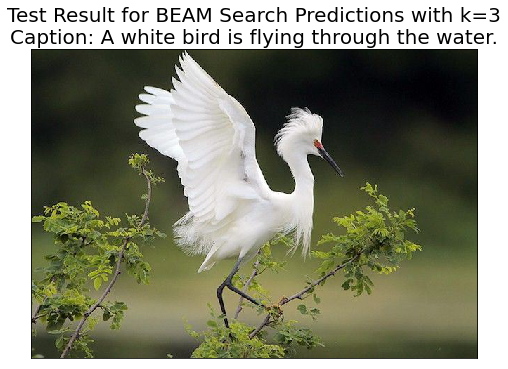

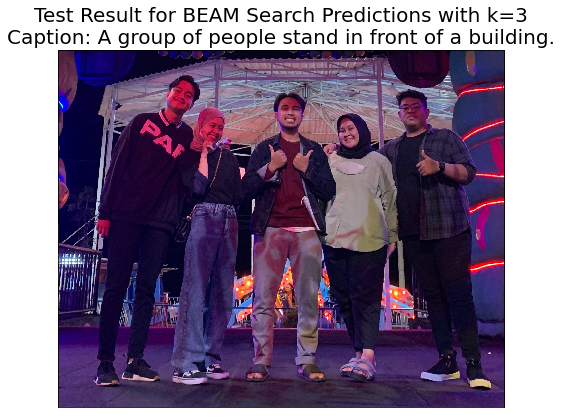

In [ ]:
# Load and prepare the image
try:
	for image_file in os.listdir(config['test_data_path']):
		if(image_file.split('--')[0]=='output'):
			continue
		if(image_file.split('.')[1]=='jpg' or image_file.split('.')[1]=='jpeg'):
			print('Generating caption for {}'.format(image_file))
			# Encode image using CNN Model
			image = extract_features(config['test_data_path']+image_file, image_model, config['model_type'])
			# Generate caption using Decoder RNN Model + BEAM search
			generated_caption = generate_caption_beam_search(caption_model, tokenizer, image, max_length, beam_index=config['beam_search_k'])
			# Remove startseq and endseq
			caption = 'Caption: ' + generated_caption.split()[1].capitalize()
			for x in generated_caption.split()[2:len(generated_caption.split())-1]:
					caption = caption + ' ' + x
			caption += '.'
			# Show image and its caption
			pil_im = Image.open(config['test_data_path']+image_file, 'r')
			fig, ax = plt.subplots(figsize=(8, 8))
			ax.get_xaxis().set_visible(False)
			ax.get_yaxis().set_visible(False)
			_ = ax.imshow(np.asarray(pil_im), interpolation='nearest')
			speech = gTTS('Predicted ' + caption, lang = 'en', slow = False)
			speech.save('voice.mp3')
			audio_file = 'voice.mp3'
			display.display(display.Audio(audio_file, rate = None, autoplay = False))
			_ = ax.set_title("Test Result for BEAM Search Predictions with k={}\n{}".format(config['beam_search_k'],caption),fontdict={'fontsize': '20','fontweight' : '40'})
			plt.savefig(config['output_test_data_path']+'output-Beam--'+image_file)
except IndexError:
	print("All Images :")
	print(" ")
	pass

## Bleu

Evaluate the model on BLEU Score using argmax predictions

In [ ]:
def evaluate_model(model, images, captions, tokenizer, max_length):
	actual, predicted = list(), list()
	for image_id, caption_list in tqdm(captions.items()):
		yhat = generate_caption(model, tokenizer, images[image_id], max_length)
		ground_truth = [caption.split() for caption in caption_list]
		actual.append(ground_truth)
		predicted.append(yhat.split())
	print('BLEU Scores with Argmax Predictions:')
	print('A perfect match results in a score of 1.0, whereas a perfect mismatch results in a score of 0.0.')
	print('BLEU-1: %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
	print('BLEU-2: %f' % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
	print('BLEU-3: %f' % corpus_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
	print('BLEU-4: %f' % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

Evaluate the model on BLEU Score using BEAM search predictions

In [ ]:
def evaluate_model_beam_search(model, images, captions, tokenizer, max_length, beam_index=3):
	actual, predicted = list(), list()
	for image_id, caption_list in tqdm(captions.items()):
		yhat = generate_caption_beam_search(model, tokenizer, images[image_id], max_length, beam_index=beam_index)
		ground_truth = [caption.split() for caption in caption_list]
		actual.append(ground_truth)
		predicted.append(yhat.split())
	print('BLEU Scores with Beam Search Predictions:')
	print('A perfect match results in a score of 1.0, whereas a perfect mismatch results in a score of 0.0.')
	print('BLEU-1: %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
	print('BLEU-2: %f' % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
	print('BLEU-3: %f' % corpus_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
	print('BLEU-4: %f' % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

Evaluate the model on validation data and ouput BLEU score

In [ ]:
print('Model trained successfully. Running model on validation set for calculating BLEU score using argmax predictions')
evaluate_model(model, X1val, X2val, tokenizer, max_length)

Model trained successfully. Running model on validation set for calculating BLEU score using argmax predictions


100%|██████████| 1000/1000 [14:50<00:00,  1.12it/s]


BLEU Scores with Argmax Predictions:
A perfect match results in a score of 1.0, whereas a perfect mismatch results in a score of 0.0.
BLEU-1: 0.596393
BLEU-2: 0.347015
BLEU-3: 0.242815
BLEU-4: 0.123927


In [ ]:
print('Model trained successfully. Running model on validation set for calculating BLEU score using BEAM search with k={}'.format(config['beam_search_k']))
evaluate_model_beam_search(model, X1val, X2val, tokenizer, max_length, beam_index=config['beam_search_k'])

Model trained successfully. Running model on validation set for calculating BLEU score using BEAM search with k=3


100%|██████████| 1000/1000 [2:22:39<00:00,  8.56s/it]


BLEU Scores with Beam Search Predictions:
A perfect match results in a score of 1.0, whereas a perfect mismatch results in a score of 0.0.
BLEU-1: 0.605931
BLEU-2: 0.355516
BLEU-3: 0.251673
BLEU-4: 0.131444
